In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle

from scipy.ndimage.interpolation import zoom
from PIL import Image
from scipy.misc import imsave
import glob
from os.path import basename
from scipy.misc import imresize


from keras import Model
from keras.models import load_model
from keras.layers import Conv2D, Input, Dense,Flatten,LeakyReLU
from keras.callbacks import TensorBoard, ModelCheckpoint, EarlyStopping
from keras import backend as K
import tensorflow as tf
import keras

from image_helper import *

ImportError: cannot import name 'imsave'

# Load Data

In [2]:
#augmented_train_data, augmented_train_label = load_augmented_data("./augmented_data/", "train")
augmented_validation_data, augmented_validation_label = load_augmented_data("./augmented_data/", "val")

partition_dict, labels_dict = get_generator_dicts("./augmented_data/")

NameError: name 'load_augmented_data' is not defined

In [7]:
augmented_validation_data.shape

(104, 326, 490, 3)

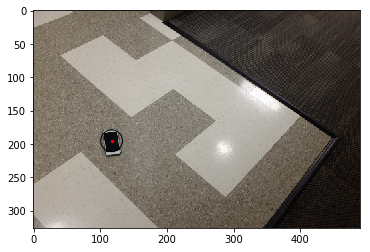

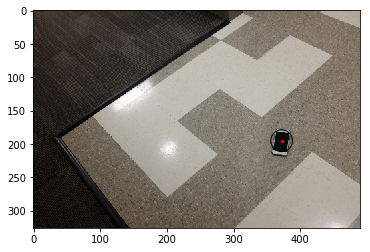

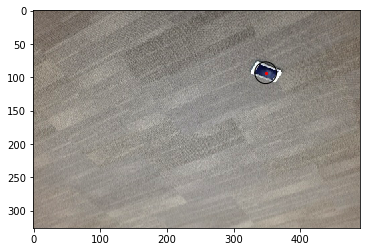

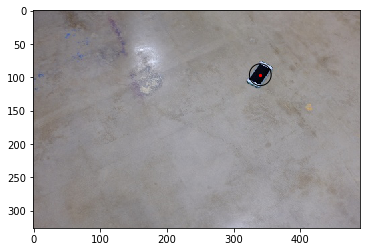

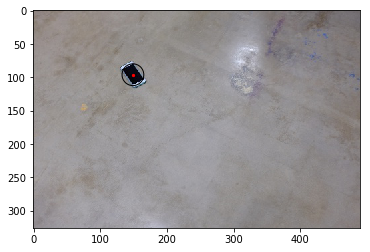

...

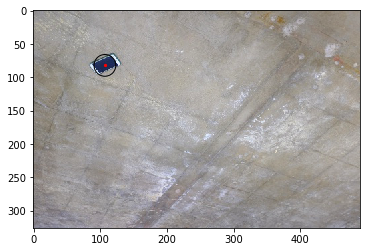

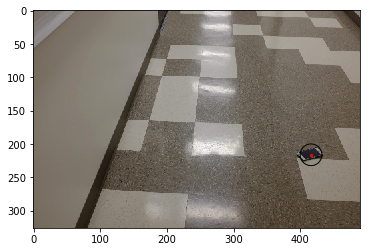

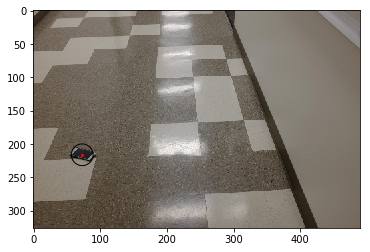

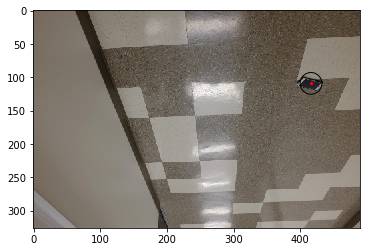

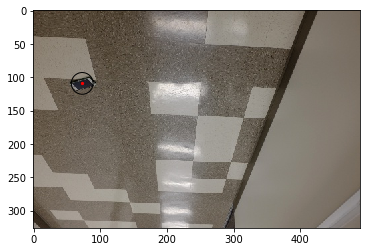

In [4]:
for i, im_ in enumerate(augmented_train_data[:20]):
    plot_with_label(im_, augmented_train_label[i][0], augmented_train_label[i][1])

In [11]:
resize_factor = 0.6
augmented_train_data_resized = np.zeros((augmented_train_data.shape[0], imresize(augmented_train_data[0], resize_factor).shape[0], imresize(augmented_train_data[0], resize_factor).shape[1], 3))
augmented_validation_data_resized = np.zeros((augmented_validation_data.shape[0], imresize(augmented_validation_data[0], resize_factor).shape[0], imresize(augmented_validation_data[0], resize_factor).shape[1], 3))


for i, im in enumerate(augmented_train_data):
    augmented_train_data_resized[i] = imresize(im, resize_factor)/255
   

for i, im in enumerate(augmented_validation_data):
    augmented_validation_data_resized[i] = imresize(im, resize_factor)/255
    #plot_with_label(augmented_validation_data_resized[i], augmented_validation_label[i][0], augmented_validation_label[i][1])
   
augmented_train_data = augmented_train_data_resized
augmented_validation_data = augmented_validation_data_resized

C:\Users\Luca\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  
C:\Users\Luca\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\Luca\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
  import sys
C:\Users\Luca\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instea

In [8]:
n_rows, n_cols = augmented_train_data[0].shape[0], augmented_train_data[0].shape[1]
augmented_train_label_fully_convolutional = np.array([transform_label(augmented_train_label[i][0], augmented_train_label[i][1], n_rows, n_cols) for i in range(augmented_train_label.shape[0])])
augmented_validation_label_fully_convolutional = np.array([transform_label(augmented_validation_label[i][0], augmented_validation_label[i][1], augmented_validation_data[0].shape[0], augmented_validation_data[0].shape[1]) for i in range(augmented_validation_label.shape[0])])

augmented_train_label_fully_convolutional = np.expand_dims(augmented_train_label_fully_convolutional, axis=3)
augmented_validation_label_fully_convolutional = np.expand_dims(augmented_validation_label_fully_convolutional, axis=3)

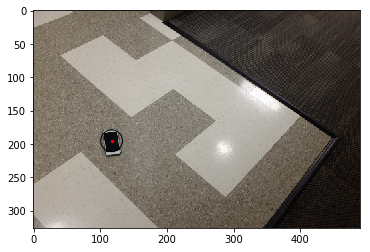

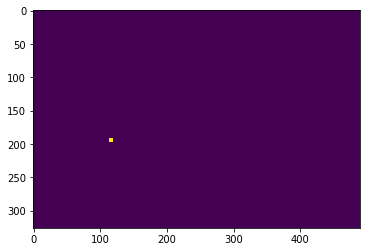

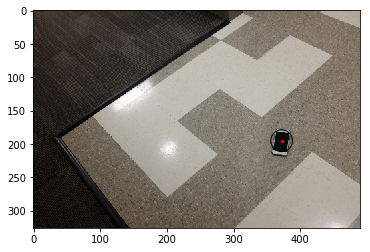

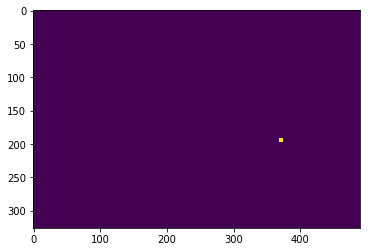

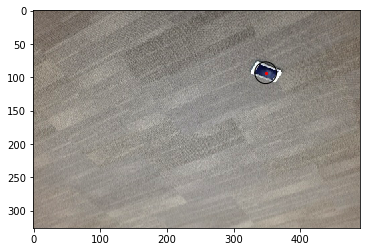

...

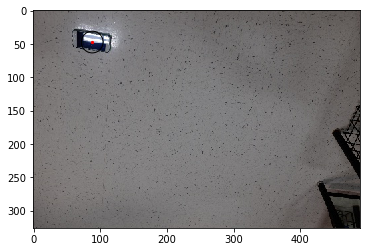

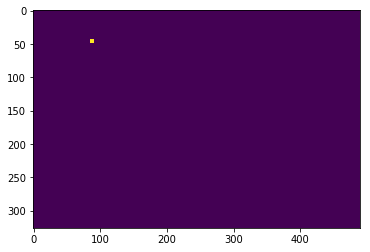

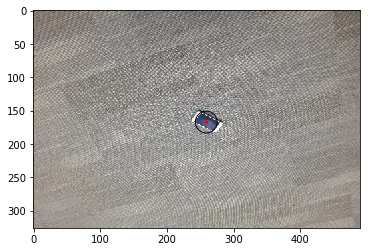

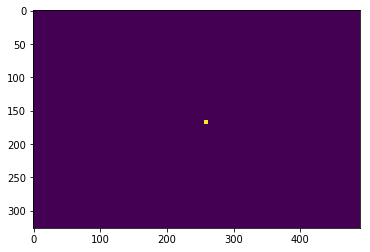

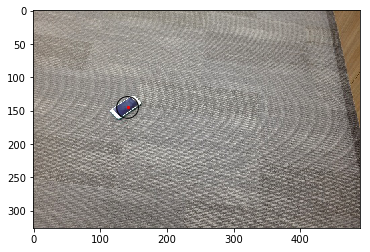

In [ ]:
for i, label in enumerate(augmented_train_label_fully_convolutional):
    plot_with_label(augmented_train_data[i], augmented_train_label[i][0], augmented_train_label[i][1])
    plt.imshow(label.squeeze())
    plt.show()

In [3]:
class DataGeneratorFullyConvolutional(keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, path, list_IDs, labels, batch_size=32, dim=(32,32,32), n_channels=3,
                 n_classes=2, shuffle=True):
        'Initialization'
        self.dim = dim
        self.batch_size = batch_size
        self.labels = labels
        self.list_IDs = list_IDs
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.shuffle = shuffle
        self.on_epoch_end()
        self.path = path

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        list_IDs_temp = [self.list_IDs[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(list_IDs_temp)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.empty((self.batch_size, *self.dim, self.n_channels))
        y = np.empty((self.batch_size, *self.dim, 1), dtype=int)
        
        

        # Generate data
        for i, ID in enumerate(list_IDs_temp):
            # Store sample
            X[i,] = imresize(np.array(Image.open(self.path + ID + '.png')),0.6)/255.0
            
            
            # Store class
            y[i] = np.expand_dims(transform_label(self.labels[ID][0], self.labels[ID][1], *self.dim), axis=3)
            

        return X, y

# Model

In [4]:
tbCallBack = TensorBoard(log_dir='./logs/regression', histogram_freq=2, batch_size=32, write_graph=True, write_grads=True, write_images=True)
cpCallBack = ModelCheckpoint('./checkpoints/regression/weights-improvement-{epoch:02d}-{val_loss:.2f}.hdf5', monitor='val_loss', verbose=0, save_best_only=False, save_weights_only=False, mode='auto', period=3)
esCallBack = EarlyStopping(monitor='val_loss', min_delta=0, patience=3, verbose=0, mode='auto')

K.clear_session()
sess = tf.Session()
K.set_session(sess)

In [5]:
input_img = Input(shape=(195, 294, 3))

x = Conv2D(32, (3, 3), padding='same', activation='relu')(input_img)
x = Conv2D(32, (3, 3), padding='same', activation='relu')(x)
x = Conv2D(32, (3, 3), padding='same', activation='relu')(x)
x = Conv2D(32, (3, 3), padding='same', activation='relu')(x)
output = Conv2D(1, (1, 1), padding='same', activation='sigmoid')(x)


model_full_conv = Model(inputs=input_img, outputs=output)
model_full_conv.compile(optimizer='adam', loss='binary_crossentropy')

#tbCallBack.set_model(model)
print(model_full_conv.summary())

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 195, 294, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 195, 294, 32)      896       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 195, 294, 32)      9248      
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 195, 294, 32)      9248      
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 195, 294, 32)      9248      
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 195, 294, 1)       33        
Total params: 28,673
Trainable params: 28,673
Non-trainable params: 0
_________________________________________________________________
None


In [10]:
print(augmented_validation_label.shape)
ys0, xs0 = np.where(augmented_validation_label_fully_convolutional[0,:,:,0] == 0)
ys1, xs1 = np.where(augmented_validation_label_fully_convolutional[0,:,:,0] == 1)


weights = np.zeros((32,2))
weights[:,0] = 1
weights[:,1] = ys0.shape[0] / ys1.shape[0]
print(ys0.shape[0] / ys1.shape[0])

NameError: name 'augmented_validation_label' is not defined

In [6]:
params = {'dim': (195, 294),
          'batch_size': 16,
          'n_classes': 2,
          'n_channels': 3,
          'shuffle': True}
training_generator = DataGeneratorFullyConvolutional("./augmented_data/", partition_dict['train'], labels_dict, **params)
validation_generator = DataGeneratorFullyConvolutional("./augmented_data/", partition_dict['val'], labels_dict, **params)

history = model_full_conv.fit_generator(generator=training_generator, validation_data=validation_generator, epochs=6, callbacks=[cpCallBack, esCallBack], class_weight=weights)

#history = model_full_conv.fit(augmented_train_data, augmented_train_label_fully_convolutional, validation_data=[augmented_validation_data, augmented_validation_label_fully_convolutional] ,epochs=6, batch_size=32, callbacks=[tbCallBack, cpCallBack, esCallBack], class_weight=weights)

Epoch 1/6


C:\Users\Luca\Anaconda3\lib\site-packages\ipykernel_launcher.py:50: DeprecationWarning: `imresize` is deprecated!
`imresize` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``skimage.transform.resize`` instead.
C:\Users\Luca\Anaconda3\lib\site-packages\ipykernel_launcher.py:54: DeprecationWarning: Both axis > a.ndim and axis < -a.ndim - 1 are deprecated and will raise an AxisError in the future.


412/412 [==============================] - 179s 435ms/step - loss: 0.0068 - val_loss: 4.5090e-04
Epoch 2/6
412/412 [==============================] - 185s 450ms/step - loss: 3.5996e-04 - val_loss: 4.0488e-04
Epoch 3/6
412/412 [==============================] - 180s 436ms/step - loss: 3.3650e-04 - val_loss: 3.9667e-04
Epoch 4/6
412/412 [==============================] - 182s 442ms/step - loss: 3.2696e-04 - val_loss: 4.6238e-04
Epoch 5/6
412/412 [==============================] - 185s 449ms/step - loss: 3.2068e-04 - val_loss: 4.1155e-04
Epoch 6/6
280/412 [===================>..........] - ETA: 55s - loss: 3.3535e-04

KeyboardInterrupt: 

[[0.13790911 0.5474977 ]
 [0.6400625  0.4950894 ]
 [0.45212555 0.51387715]
 [0.57103604 0.5662589 ]
 [0.4511922  0.59307516]
 [0.562071   0.5641136 ]
 [0.43970823 0.584478  ]
 [0.47744453 0.4791448 ]
 [0.41370642 0.5355122 ]
 [0.45020863 0.47101867]]


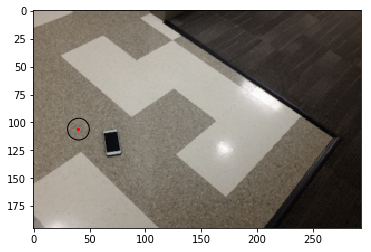

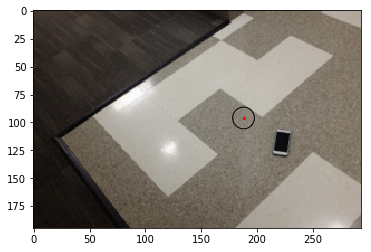

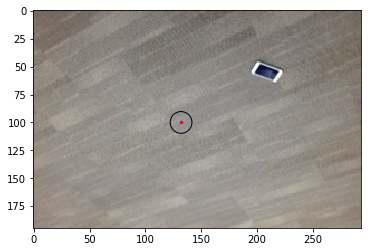

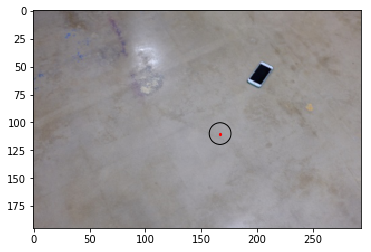

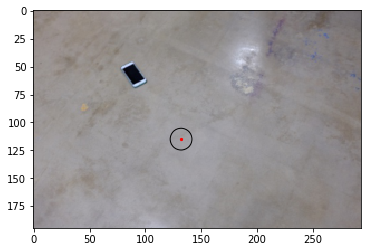

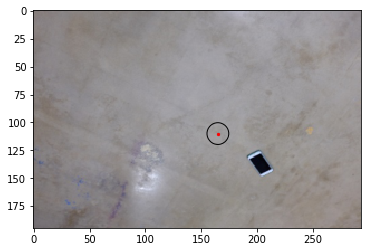

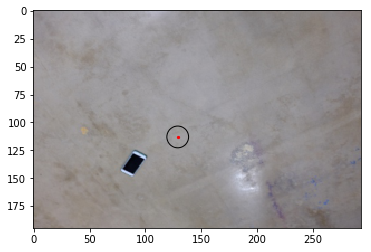

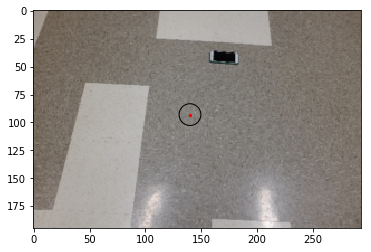

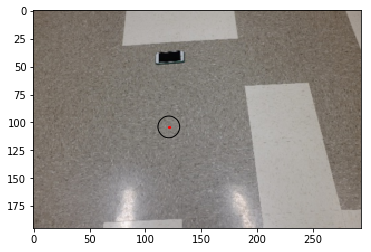

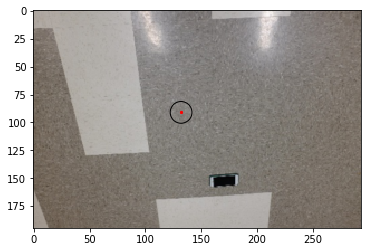

In [12]:
predictions = model_full_conv.predict(augmented_train_data[:10])
for i, pred in enumerate(predictions):
    pred = pred[:,:,0]
    pred[pred>0.5] = 1
    pred[pred<= 0.5] = 0
    pred_x, pred_y = evaluate_label(pred)
    
    plot_with_label(augmented_train_data[i], pred_x, pred_y)
    plt.imshow(pred)
    plt.show()

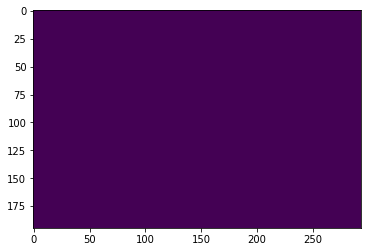

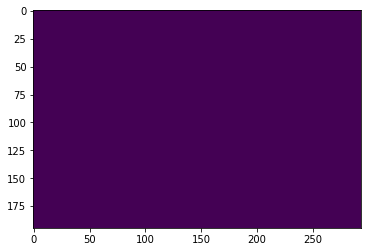

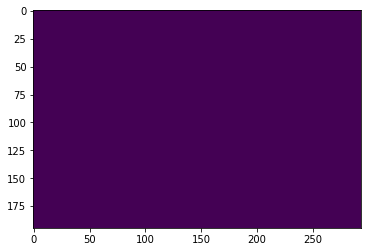

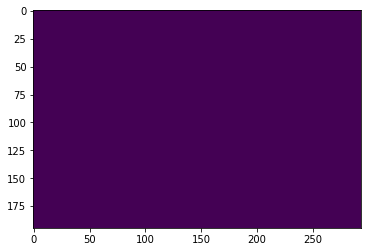

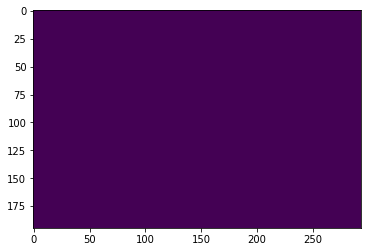

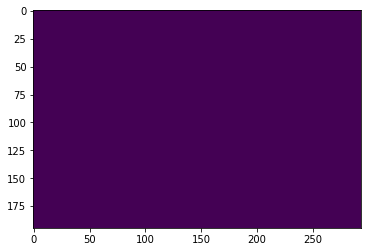

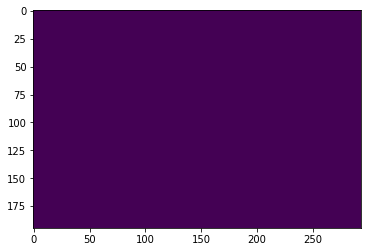

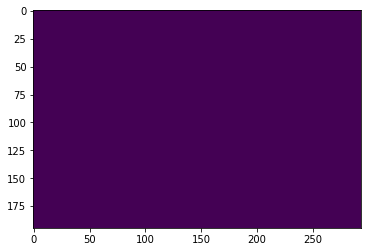

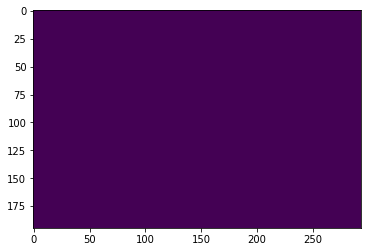

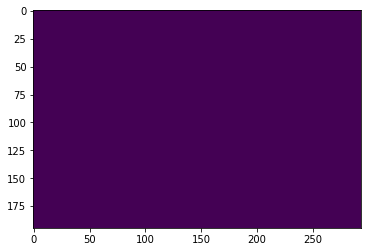

In [13]:
predictions = model_full_conv.predict(augmented_validation_data[:10])
for i, pred in enumerate(predictions):
    pred = pred[:,:,0]
    pred[pred>0.5] = 1
    pred[pred<= 0.5] = 0
    #pred_x, pred_y = evaluate_label(pred)
    #plot_with_label(augmented_validation_data[i], pred_x, pred_y)
    
    plt.imshow(pred)
    plt.show()

# Already Trained Model

In [ ]:
model_full_conv = load_model("./checkpoints/fully_convolutional/weights-improvement-02-0.71.hdf5")
predictions = loaded_model_full_conv.predict(augmented_train_data[:10])

predictions = model_full_conv.predict(augmented_validation_data[:10])
for i, pred in enumerate(predictions):
    pred = pred[:,:,0]
    pred[pred>0.5] = 1
    pred[pred<= 0.5] = 0
    pred_x, pred_y = evaluate_label(pred)
    plot_with_label(augmented_validation_data[i], pred_x, pred_y)
    
    plt.imshow(pred)
    plt.show()